## Read Features and Labels for Paragraph (title and summary)

In [1]:
import pandas as pd
df1 = pd.read_csv("training_MEDQA_first_token.csv")

In [2]:
df1.head(5)

,model_1_gold_lp_median,model_1_gold_lp_max,model_1_gold_lp_min,model_1_gold_lp_std,model_1_gold_lp_moment1,model_1_gold_lp_moment2,model_1_gold_lp_moment3,model_1_gold_lp_moment4,model_1_gold_lp_moment5,model_1_gold_lp_q95,...,kl_4_vs_6_q90,kl_4_vs_6_q85,kl_4_vs_6_q80,kl_4_vs_6_q20,kl_4_vs_6_q15,kl_4_vs_6_q10,kl_4_vs_6_q05,label,source_file,file_path
0,-5.397053,-5.397053,-5.397053,-5.397053,-5.397053,-5.397053,-5.397053,-5.397053,-5.397053,-5.397053,...,0.000259,0.000259,0.000259,0.000259,0.000259,0.000259,0.000259,hallucination,logprob_matrix_1.csv,NCT00001/logprob_matrix_1.csv
1,-12.369120,-12.369120,-12.369120,-12.369120,-12.369120,-12.369120,-12.369120,-12.369120,-12.369120,-12.369120,...,0.000259,0.000259,0.000259,0.000259,0.000259,0.000259,0.000259,hallucination,logprob_matrix_2.csv,NCT00001/logprob_matrix_2.csv
2,-8.883085,-8.883085,-8.883085,-8.883085,-8.883085,-8.883085,-8.883085,-8.883085,-8.883085,-8.883085,...,0.000259,0.000259,0.000259,0.000259,0.000259,0.000259,0.000259,hallucination,logprob_matrix_3.csv,NCT00001/logprob_matrix_3.csv
3,-0.033924,-0.033924,-0.033924,-0.033924,-0.033924,-0.033924,-0.033924,-0.033924,-0.033924,-0.033924,...,0.000259,0.000259,0.000259,0.000259,0.000259,0.000259,0.000259,fact,logprob_matrix_4.csv,NCT00001/logprob_matrix_4.csv
4,-0.000030,-0.000030,-0.000030,-0.000030,-0.000030,-0.000030,-0.000030,-0.000030,-0.000030,-0.000030,...,0.001473,0.001473,0.001473,0.001473,0.001473,0.001473,0.001473,fact,logprob_matrix_1.csv,NCT00002/logprob_matrix_1.csv


In [3]:
# 1. Print initial information
print("Initial shape:", df1.shape)
print("Missing labels:", df1['label'].isna().sum())

Initial shape: (40712, 683)
Missing labels: 0


In [4]:
print("\nLabel distribution:")
print(df1['label'].value_counts(normalize=True))


Label distribution:
label
hallucination    0.75
fact             0.25
Name: proportion, dtype: float64


## Remove columns

In [5]:
# First, get a clean list of base feature names (without statistical variations and cumsum)
base_features = set()
for col in df1.columns:
    # Skip columns with 'cumsum'
    if 'cumsum' in col:
        continue
        
    # Split the column name by underscore and take everything before the last part
    parts = col.rsplit('_', 1)
    if len(parts) > 1 and parts[1] in ['median', 'max', 'min', 'std', 'moment1', 'moment2', 'moment3', 'moment4', 'moment5', 
                                      'q95', 'q90', 'q85', 'q80', 'q20', 'q15', 'q10', 'q05']:
        base_features.add(parts[0])

# Keep only one statistical version (median) for each base feature
columns_to_keep = [f"{feature}_median" for feature in base_features]

# Add non-statistical columns
metadata_columns = ['label', 'source_file', 'file_path', 'nct_number']
columns_to_keep.extend([col for col in df1.columns if col in metadata_columns])

# Create filtered DataFrame
df_filtered = df1[columns_to_keep]

# Print info
print(f"Original columns: {df1.shape[1]}")
print(f"Columns kept: {len(columns_to_keep)}")
print("\nKept columns:")
print(columns_to_keep)

# Print sample
print("\nSample of filtered DataFrame:")
print(df_filtered.head())

Original columns: 683
Columns kept: 38

Kept columns:
['kl_1_vs_2_median', 'model_3_gold_lp_normalized_median', 'model_3_Entropy_median', 'model_3_rank_median', 'model_4_rank_median', 'kl_1_vs_6_median', 'model_1_gold_prob_median', 'kl_2_vs_3_median', 'model_3_gold_prob_median', 'model_2_rank_median', 'model_2_Entropy_median', 'model_2_gold_lp_median', 'model_4_Entropy_median', 'model_1_rank_median', 'kl_3_vs_4_median', 'model_3_gold_lp_median', 'kl_1_vs_3_median', 'model_1_gold_lp_median', 'model_6_rank_median', 'model_4_gold_lp_median', 'model_6_gold_lp_normalized_median', 'model_4_gold_prob_median', 'model_2_gold_lp_normalized_median', 'model_6_gold_lp_median', 'model_6_Entropy_median', 'kl_3_vs_6_median', 'model_1_gold_lp_normalized_median', 'kl_4_vs_6_median', 'kl_2_vs_6_median', 'kl_2_vs_4_median', 'model_1_Entropy_median', 'kl_1_vs_4_median', 'model_2_gold_prob_median', 'model_6_gold_prob_median', 'model_4_gold_lp_normalized_median', 'label', 'source_file', 'file_path']

Sample 

In [6]:
df_filtered

,kl_1_vs_2_median,model_3_gold_lp_normalized_median,model_3_Entropy_median,model_3_rank_median,model_4_rank_median,kl_1_vs_6_median,model_1_gold_prob_median,kl_2_vs_3_median,model_3_gold_prob_median,model_2_rank_median,...,kl_2_vs_6_median,kl_2_vs_4_median,model_1_Entropy_median,kl_1_vs_4_median,model_2_gold_prob_median,model_6_gold_prob_median,model_4_gold_lp_normalized_median,label,source_file,file_path
0,0.052151,1.677836,0.318720,3.0,2.0,0.121717,4.529911e-03,0.062132,0.031097,2.0,...,0.003808,0.002828,0.190912,0.098519,0.001598,3.834093e-04,-0.864020,hallucination,logprob_matrix_1.csv,NCT00001/logprob_matrix_1.csv
1,0.052151,1.923380,0.318720,2.0,4.0,0.121717,4.247755e-06,0.062132,0.037185,6.0,...,0.003808,0.002828,0.190912,0.098519,0.000013,9.610552e-07,-0.174222,hallucination,logprob_matrix_2.csv,NCT00001/logprob_matrix_2.csv
2,0.052151,1.575935,0.318720,4.0,7.0,0.121717,1.387156e-04,0.062132,0.001780,7.0,...,0.003808,0.002828,0.190912,0.098519,0.000011,1.149180e-06,-0.970454,hallucination,logprob_matrix_3.csv,NCT00001/logprob_matrix_3.csv
3,0.052151,-1.796676,0.318720,1.0,1.0,0.121717,9.666449e-01,0.062132,0.928687,1.0,...,0.003808,0.002828,0.190912,0.098519,0.996872,9.995140e-01,0.754260,fact,logprob_matrix_4.csv,NCT00001/logprob_matrix_4.csv
4,0.000560,-1.999584,0.225099,1.0,1.0,0.000053,9.999704e-01,0.039983,0.957636,1.0,...,0.000772,0.000313,0.000352,0.000841,0.999339,9.998943e-01,0.469052,fact,logprob_matrix_1.csv,NCT00002/logprob_matrix_1.csv
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40707,0.045513,1.307611,0.085247,6.0,4.0,0.046600,1.234408e-06,0.012507,0.000129,8.0,...,0.000355,0.002911,0.099651,0.090196,0.000045,2.194362e-05,-0.613321,hallucination,logprob_matrix_4.csv,NCT10177/logprob_matrix_4.csv
40708,0.340840,0.899784,0.538228,1.0,2.0,0.395519,3.205844e-04,0.013941,0.776689,2.0,...,0.004088,0.371398,0.006463,0.037407,0.289908,3.283320e-01,-0.169375,hallucination,logprob_matrix_1.csv,NCT10178/logprob_matrix_1.csv
40709,0.340840,0.914262,0.538228,3.0,3.0,0.395519,1.256393e-06,0.013941,0.001041,4.0,...,0.004088,0.371398,0.006463,0.037407,0.000556,1.506005e-04,0.251218,hallucination,logprob_matrix_2.csv,NCT10178/logprob_matrix_2.csv
40710,0.340840,-1.914093,0.538228,2.0,1.0,0.395519,9.993281e-01,0.013941,0.222215,1.0,...,0.004088,0.371398,0.006463,0.037407,0.708689,6.712284e-01,0.764151,fact,logprob_matrix_3.csv,NCT10178/logprob_matrix_3.csv


## Clean Distribution

In [7]:
# df = df1 #.dropna()
df = df_filtered

print(f"Original shape: {df1.shape}")
print(f"Shape after removing NaN labels: {df.shape}")
print("\nLabel distribution in clean data:")

Original shape: (40712, 683)
Shape after removing NaN labels: (40712, 38)

Label distribution in clean data:


In [8]:
import pandas as pd
import re

# Assuming your dataframe is called 'df'
# Extract NCT number from file_path
df['nct_number'] = df['file_path'].str.extract(r'(NCT\d+)')

# Count facts per NCT number
fact_counts = df[df['label'] == 'fact'].groupby('nct_number').size()

# Display the counts
print("Number of facts per NCT study:")
print(fact_counts)

# Summary statistics
print("\nSummary:")
print(f"Total NCT studies: {len(fact_counts)}")
print(f"Total facts: {fact_counts.sum()}")
print(f"Average facts per NCT: {fact_counts.mean():.2f}")
print(f"Min facts per NCT: {fact_counts.min()}")
print(f"Max facts per NCT: {fact_counts.max()}")

# Count NCTs with exactly 1 fact (expected pattern)
ncts_with_one_fact = (fact_counts == 1).sum()
print(f"NCT studies with exactly 1 fact: {ncts_with_one_fact} ({ncts_with_one_fact/len(fact_counts)*100:.2f}%)")

# Check if any NCTs have no facts
all_ncts = df['nct_number'].unique()
ncts_without_facts = set(all_ncts) - set(fact_counts.index)
if ncts_without_facts:
    print(f"\nWarning: {len(ncts_without_facts)} NCT studies have no facts")
    print("First 5 NCTs without facts:", list(ncts_without_facts)[:5])

Number of facts per NCT study:
nct_number
NCT00001    1
NCT00002    1
NCT00003    1
NCT00004    1
NCT00005    1
           ..
NCT10174    1
NCT10175    1
NCT10176    1
NCT10177    1
NCT10178    1
Length: 10178, dtype: int64

Summary:
Total NCT studies: 10178
Total facts: 10178
Average facts per NCT: 1.00
Min facts per NCT: 1
Max facts per NCT: 1
NCT studies with exactly 1 fact: 10178 (100.00%)


/tmp/ipykernel_2705459/1830655378.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['nct_number'] = df['file_path'].str.extract(r'(NCT\d+)')


## Clean dataset

In [9]:
import pandas as pd
import numpy as np

# Assuming your dataframe is called 'df'
# First, extract NCT number if not already done
if 'nct_number' not in df.columns:
    df['nct_number'] = df['file_path'].str.extract(r'(NCT\d+)')

# Step 1: Find NCT numbers that have any NaN values
nct_with_na = df[df.isna().any(axis=1)]['nct_number'].unique()
print(f"Found {len(nct_with_na)} NCT studies with NaN values")

# Step 2: Drop all rows associated with those NCT numbers
df_2 = df[~df['nct_number'].isin(nct_with_na)].copy()

# Step 3: Report results
rows_before = len(df)
rows_after = len(df_2)
rows_dropped = rows_before - rows_after
nct_before = df['nct_number'].nunique()
nct_after = df_2['nct_number'].nunique()
nct_dropped = nct_before - nct_after

print(f"Original dataframe: {rows_before} rows, {nct_before} NCT studies")
print(f"Cleaned dataframe: {rows_after} rows, {nct_after} NCT studies")
print(f"Dropped: {rows_dropped} rows, {nct_dropped} NCT studies")

# Optional: Check if the expected pattern of 4 rows per NCT is maintained
rows_per_nct = df_2.groupby('nct_number').size()
print("\nRows per NCT in cleaned dataframe:")
print(rows_per_nct.value_counts())

# Optional: Reset index
df_2 = df_2.reset_index(drop=True)
df_2.isna().any().any()

Found 0 NCT studies with NaN values
Original dataframe: 40712 rows, 10178 NCT studies
Cleaned dataframe: 40712 rows, 10178 NCT studies
Dropped: 0 rows, 0 NCT studies

Rows per NCT in cleaned dataframe:
4    10178
Name: count, dtype: int64


False

In [10]:
df_clean = df_2
df_clean.head()

,kl_1_vs_2_median,model_3_gold_lp_normalized_median,model_3_Entropy_median,model_3_rank_median,model_4_rank_median,kl_1_vs_6_median,model_1_gold_prob_median,kl_2_vs_3_median,model_3_gold_prob_median,model_2_rank_median,...,kl_2_vs_4_median,model_1_Entropy_median,kl_1_vs_4_median,model_2_gold_prob_median,model_6_gold_prob_median,model_4_gold_lp_normalized_median,label,source_file,file_path,nct_number
0,0.052151,1.677836,0.318720,3.0,2.0,0.121717,0.004530,0.062132,0.031097,2.0,...,0.002828,0.190912,0.098519,0.001598,3.834093e-04,-0.864020,hallucination,logprob_matrix_1.csv,NCT00001/logprob_matrix_1.csv,NCT00001
1,0.052151,1.923380,0.318720,2.0,4.0,0.121717,0.000004,0.062132,0.037185,6.0,...,0.002828,0.190912,0.098519,0.000013,9.610552e-07,-0.174222,hallucination,logprob_matrix_2.csv,NCT00001/logprob_matrix_2.csv,NCT00001
2,0.052151,1.575935,0.318720,4.0,7.0,0.121717,0.000139,0.062132,0.001780,7.0,...,0.002828,0.190912,0.098519,0.000011,1.149180e-06,-0.970454,hallucination,logprob_matrix_3.csv,NCT00001/logprob_matrix_3.csv,NCT00001
3,0.052151,-1.796676,0.318720,1.0,1.0,0.121717,0.966645,0.062132,0.928687,1.0,...,0.002828,0.190912,0.098519,0.996872,9.995140e-01,0.754260,fact,logprob_matrix_4.csv,NCT00001/logprob_matrix_4.csv,NCT00001
4,0.000560,-1.999584,0.225099,1.0,1.0,0.000053,0.999970,0.039983,0.957636,1.0,...,0.000313,0.000352,0.000841,0.999339,9.998943e-01,0.469052,fact,logprob_matrix_1.csv,NCT00002/logprob_matrix_1.csv,NCT00002


## PCA

In [11]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import numpy as np

# 1. Remove non-feature columns (label, source_file, file_path)
feature_columns = [col for col in df_clean.columns 
                  if col not in ['label', 'source_file', 'file_path', 'nct_number']]
X = df_clean[feature_columns]

# 2. Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 3. Create and fit PCA
# n_components=None means keep all components
pca = PCA(n_components=None)
X_pca = pca.fit_transform(X_scaled)

# 4. Print explained variance ratio
# print("Explained variance ratio:")
# print(pca.explained_variance_ratio_[:])  # First 10 components
print(f"\nCumulative variance ratio:")
print(np.cumsum(pca.explained_variance_ratio_)[:20])  # Cumulative sum of first 10

# Optional: Create DataFrame with PCA results
pca_df = pd.DataFrame(
    X_pca, 
    columns=[f'PC{i+1}' for i in range(X_pca.shape[1])],
    index=df_clean.index
)

# Optional: Add back the label column
pca_df['label'] = df_clean['label']


Cumulative variance ratio:
[0.29932119 0.41601738 0.51329728 0.59628576 0.65851736 0.71683089
 0.75925675 0.79482538 0.82809119 0.8529443  0.875247   0.89438209
 0.90967924 0.92226616 0.93401865 0.94444482 0.95347743 0.9610098
 0.96733283 0.97301574]



Variance Explained:
PC1: 0.299
PC2: 0.117
Total: 0.416


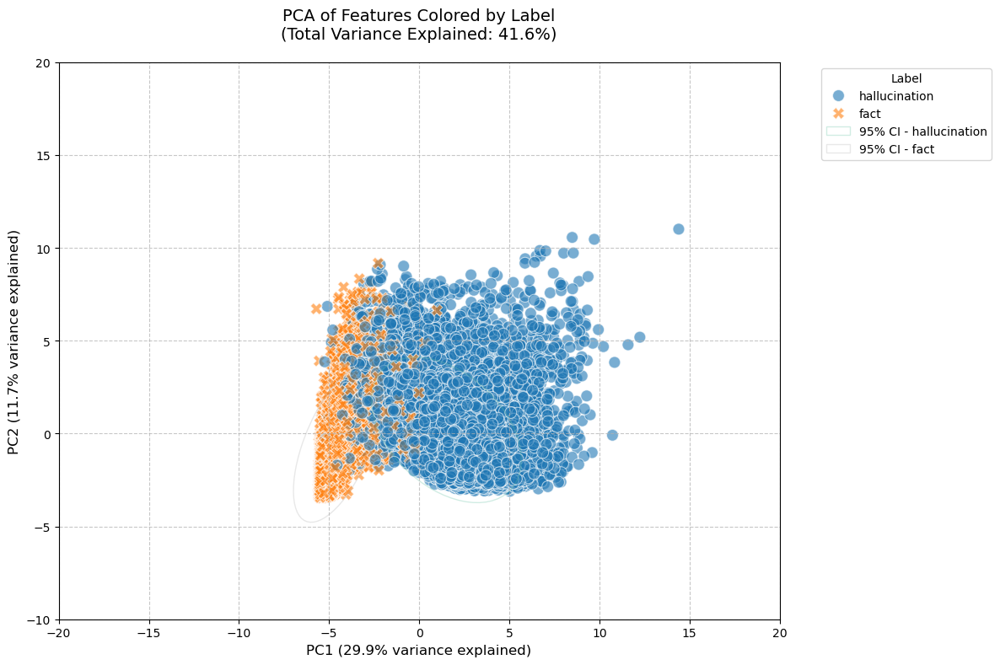

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms

# Function to create confidence ellipses
def confidence_ellipse(x, y, ax, n_std=3.0, facecolor='none', **kwargs):
    """
    Create a plot of the covariance confidence ellipse of *x* and *y*.
    """
    if x.size != y.size:
        raise ValueError("x and y must be the same size")

    cov = np.cov(x, y)
    pearson = cov[0, 1]/np.sqrt(cov[0, 0] * cov[1, 1])
    
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    ellipse = Ellipse((0, 0), width=ell_radius_x * 2, height=ell_radius_y * 2,
                      facecolor=facecolor, **kwargs)

    scale_x = np.sqrt(cov[0, 0]) * n_std
    mean_x = np.mean(x)

    scale_y = np.sqrt(cov[1, 1]) * n_std
    mean_y = np.mean(y)

    transf = transforms.Affine2D() \
        .rotate_deg(45) \
        .scale(scale_x, scale_y) \
        .translate(mean_x, mean_y)

    ellipse.set_transform(transf + ax.transData)
    return ax.add_patch(ellipse)

# Set the style to a default matplotlib style
plt.style.use('default')

# Create figure with white background
plt.figure(figsize=(12, 8), facecolor='white')

# Create main scatter plot
scatter = sns.scatterplot(data=pca_df, 
                         x='PC1', 
                         y='PC2', 
                         hue='label',
                         style='label',
                         s=100,
                         alpha=0.6)

# Get current axis
ax = plt.gca()
ax.set_facecolor('white')

# Set axis limits
plt.xlim(-20, 20)
plt.ylim(-10, 20)

# Add confidence ellipses for each label
labels = pca_df['label'].unique()
colors = plt.cm.Set2(np.linspace(0, 1, len(labels)))

for label, color in zip(labels, colors):
    mask = pca_df['label'] == label
    x = pca_df.loc[mask, 'PC1']
    y = pca_df.loc[mask, 'PC2']
    confidence_ellipse(x, y, ax, n_std=2.0, edgecolor=color, alpha=0.3, label=f'95% CI - {label}')

# Add title with variance explained
title = 'PCA of Features Colored by Label\n'
title += f'(Total Variance Explained: {sum(pca.explained_variance_ratio_[:2]):.1%})'
plt.title(title, fontsize=14, pad=20)

# Customize axes
plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.1%} variance explained)', fontsize=12)
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.1%} variance explained)', fontsize=12)

# Add legend with better positioning
plt.legend(title='Label', bbox_to_anchor=(1.05, 1), loc='upper left')

# Add grid
plt.grid(True, linestyle='--', alpha=0.7)


# # Set equal aspect ratio
# plt.axis('equal')

# Adjust layout
plt.tight_layout()

# Print variance explained
print(f"\nVariance Explained:")
print(f"PC1: {pca.explained_variance_ratio_[0]:.3f}")
print(f"PC2: {pca.explained_variance_ratio_[1]:.3f}")
print(f"Total: {sum(pca.explained_variance_ratio_[:2]):.3f}")

# Show plot
plt.show()

# Optionally save the plot
# plt.savefig('pca_visualization.png', dpi=300, bbox_inches='tight')



## 3D


Variance Explained:
PC1: 0.299
PC2: 0.117
PC3: 0.097
Total: 0.513


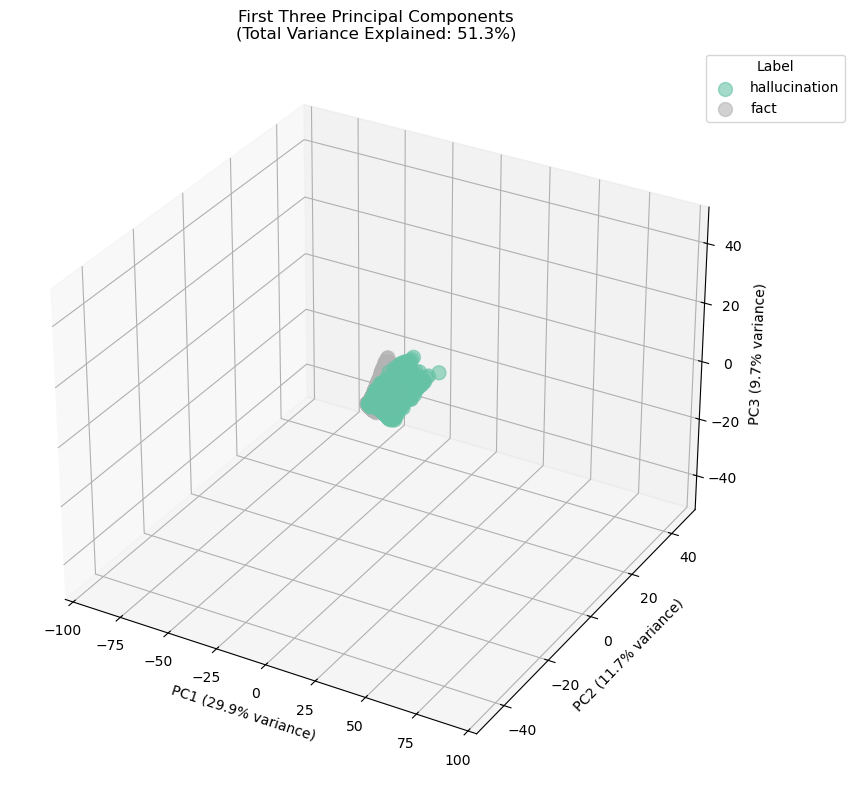

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

In [13]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from mpl_toolkits.mplot3d import Axes3D

# Set the style
plt.style.use('default')

# Create 3D figure
fig = plt.figure(figsize=(12, 8), facecolor='white')
ax = fig.add_subplot(111, projection='3d')

# Get unique labels and create color map
labels = pca_df['label'].unique()
colors = plt.cm.Set2(np.linspace(0, 1, len(labels)))
color_dict = dict(zip(labels, colors))

# Plot each label with different color
for label in labels:
    mask = pca_df['label'] == label
    ax.scatter(pca_df.loc[mask, 'PC1'], 
              pca_df.loc[mask, 'PC2'], 
              pca_df.loc[mask, 'PC3'],
              c=[color_dict[label]],
              label=label,
              alpha=0.6,
              s=100)

# Set labels and title
ax.set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.1%} variance)')
ax.set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.1%} variance)')
ax.set_zlabel(f'PC3 ({pca.explained_variance_ratio_[2]:.1%} variance)')

title = 'First Three Principal Components\n'
title += f'(Total Variance Explained: {sum(pca.explained_variance_ratio_[:3]):.1%})'
plt.title(title)

# Set axis limits
ax.set_xlim(-100, 100)
ax.set_ylim(-50, 50)
ax.set_zlim(-50, 50)

# Add legend
ax.legend(title='Label', bbox_to_anchor=(1.15, 1))

# Add grid
ax.grid(True, linestyle='--', alpha=0.3)

# Adjust layout
plt.tight_layout()

# Print variance explained
print(f"\nVariance Explained:")
print(f"PC1: {pca.explained_variance_ratio_[0]:.3f}")
print(f"PC2: {pca.explained_variance_ratio_[1]:.3f}")
print(f"PC3: {pca.explained_variance_ratio_[2]:.3f}")
print(f"Total: {sum(pca.explained_variance_ratio_[:3]):.3f}")

# Show plot
plt.show()

# Optionally save the plot
# plt.savefig('pca_3d_visualization.png', dpi=300, bbox_inches='tight')


# Add these lines after creating the plot to make it interactive
ax.view_init(elev=20, azim=45)  # Set initial viewing angle
ax.dist = 12  # Set distance from plot

# Or make it rotate (optional)
for angle in range(0, 360, 5):
    ax.view_init(30, angle)
    plt.draw()
    plt.pause(0.1)

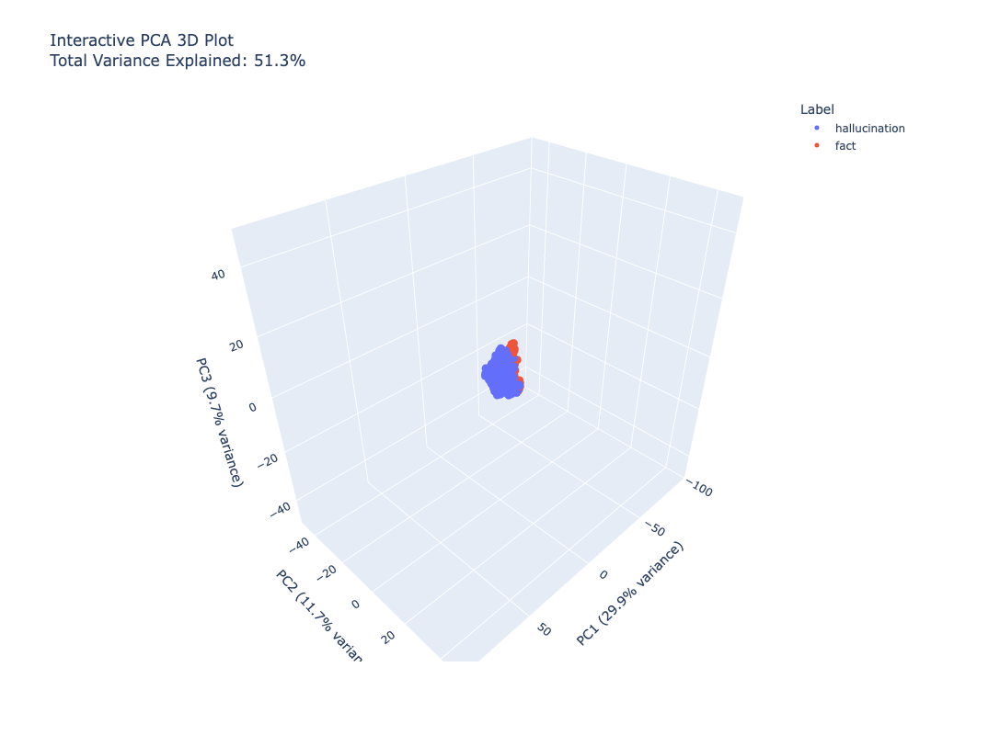

In [14]:
import plotly.express as px
import plotly.graph_objects as go

# Create DataFrame with first 3 PCs
plot_df = pca_df[['PC1', 'PC2', 'PC3', 'label']].copy()

# Create the 3D scatter plot
fig = px.scatter_3d(plot_df, 
                    x='PC1', 
                    y='PC2', 
                    z='PC3',
                    color='label',
                    title=f'Interactive PCA 3D Plot<br>Total Variance Explained: {sum(pca.explained_variance_ratio_[:3]):.1%}',
                    labels={
                        'PC1': f'PC1 ({pca.explained_variance_ratio_[0]:.1%} variance)',
                        'PC2': f'PC2 ({pca.explained_variance_ratio_[1]:.1%} variance)',
                        'PC3': f'PC3 ({pca.explained_variance_ratio_[2]:.1%} variance)'
                    })

# Update layout
fig.update_layout(
    scene=dict(
        xaxis=dict(range=[-100, 100]),
        yaxis=dict(range=[-50, 50]),
        zaxis=dict(range=[-50, 50])
    ),
    width=1000,
    height=800,
    legend=dict(
        title='Label',
        yanchor="top",
        y=0.99,
        xanchor="left",
        x=0.85
    )
)

# Update traces
fig.update_traces(
    marker=dict(size=5),
    hovertemplate="<br>".join([
        "PC1: %{x:.2f}",
        "PC2: %{y:.2f}",
        "PC3: %{z:.2f}",
        "Label: %{customdata}",
    ])
)

# Show plot
fig.show()

# Optionally save as HTML file
# fig.write_html("interactive_pca_3d.html")

## Random Forest

Total number of unique NCT files: 10178

Split Information:
Number of NCT files in training: 9161
Number of NCT files in test: 1017
Number of rows in training: 36644
Number of rows in test: 4068

Class distribution:
Training set:
 label
hallucination    0.75
fact             0.25
Name: proportion, dtype: float64

Test set:
 label
hallucination    0.75
fact             0.25
Name: proportion, dtype: float64

Classification Report:
               precision    recall  f1-score   support

         fact       0.91      0.90      0.90      1017
hallucination       0.97      0.97      0.97      3051

     accuracy                           0.95      4068
    macro avg       0.94      0.93      0.94      4068
 weighted avg       0.95      0.95      0.95      4068



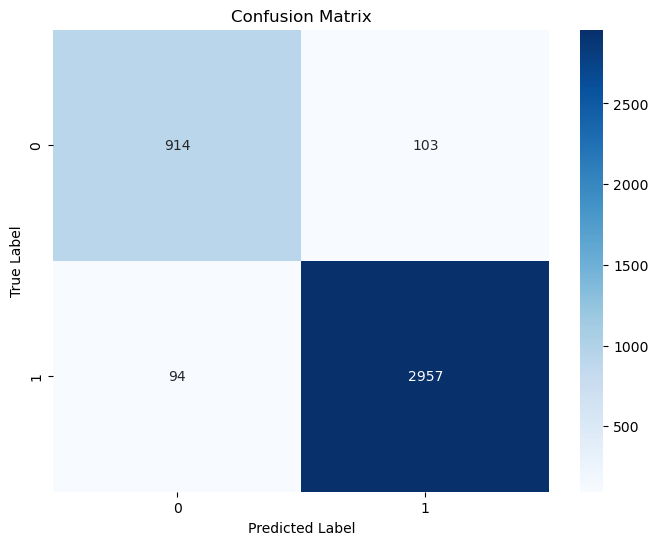

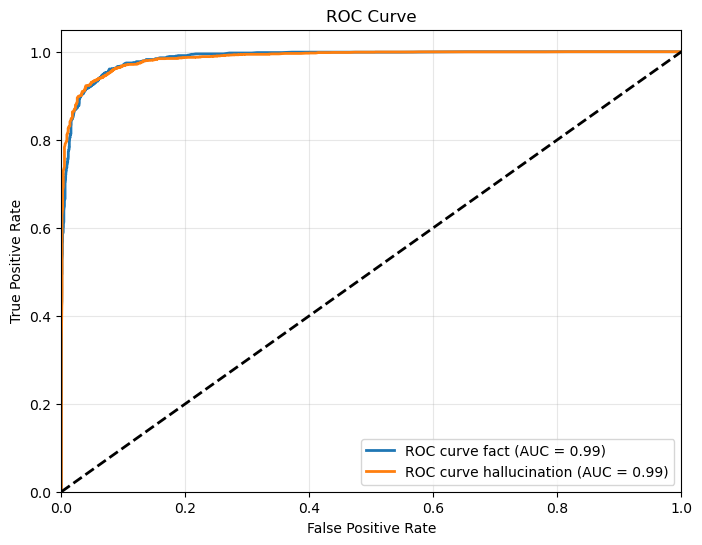

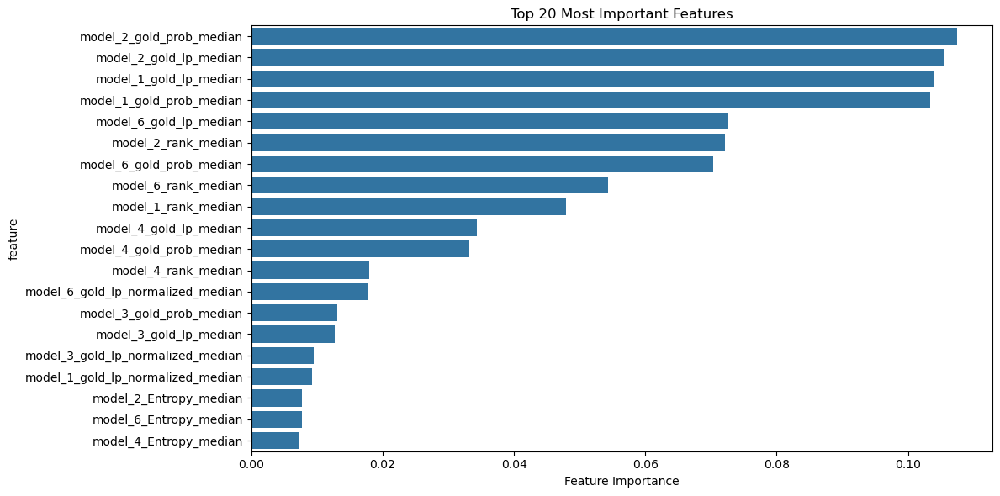


Results by NCT file:


/tmp/ipykernel_2705459/1077479058.py:112: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [15]:
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Extract unique NCT numbers
df_clean['nct_number'] = df_clean['file_path'].apply(lambda x: x.split('/')[0])
unique_ncts = df_clean['nct_number'].unique()

# Print total number of unique NCT files
print(f"Total number of unique NCT files: {len(unique_ncts)}")

# 2. Split NCT numbers into train/test (90/10)
np.random.seed(42)  # for reproducibility
test_ncts = np.random.choice(unique_ncts, size=int(len(unique_ncts)*0.1), replace=False)
train_ncts = np.array([nct for nct in unique_ncts if nct not in test_ncts])

# Create train and test sets
train_df = df_clean[df_clean['nct_number'].isin(train_ncts)]
test_df = df_clean[df_clean['nct_number'].isin(test_ncts)]

# 3. Prepare features and labels
X_train = train_df.drop(['label', 'source_file', 'file_path', 'nct_number'], axis=1)
y_train = train_df['label']
X_test = test_df.drop(['label', 'source_file', 'file_path', 'nct_number'], axis=1)
y_test = test_df['label']

# Print split information
print("\nSplit Information:")
print(f"Number of NCT files in training: {len(train_ncts)}")
print(f"Number of NCT files in test: {len(test_ncts)}")
print(f"Number of rows in training: {len(X_train)}")
print(f"Number of rows in test: {len(X_test)}")
# print("\nNCT numbers in test set:", sorted(test_ncts))

# Print class distribution
print("\nClass distribution:")
print("Training set:\n", y_train.value_counts(normalize=True))
print("\nTest set:\n", y_test.value_counts(normalize=True))

# 4. Create and train the model
rf_classifier = RandomForestClassifier(
    n_estimators=1000,
    max_depth=None,
    min_samples_split=2,
    min_samples_leaf=1,
    random_state=42,
    n_jobs=-1
)

rf_classifier.fit(X_train, y_train)

# 5. Make predictions
y_pred = rf_classifier.predict(X_test)
y_pred_proba = rf_classifier.predict_proba(X_test)

# 6. Evaluate the model
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# 7. Plot confusion matrix
plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

# 8. Plot ROC curve
plt.figure(figsize=(8, 6))
classes = rf_classifier.classes_

fpr = dict()
tpr = dict()
roc_auc = dict()

for i, class_name in enumerate(classes):
    fpr[i], tpr[i], _ = roc_curve(y_test == class_name, y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    
    plt.plot(fpr[i], tpr[i], lw=2,
             label=f'ROC curve {class_name} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.grid(True, alpha=0.3)
plt.show()

# 9. Feature importance
feature_importance = pd.DataFrame({
    'feature': X_train.columns,
    'importance': rf_classifier.feature_importances_
})
feature_importance = feature_importance.sort_values('importance', ascending=False)

plt.figure(figsize=(12, 6))
sns.barplot(data=feature_importance.head(20), x='importance', y='feature')
plt.title('Top 20 Most Important Features')
plt.xlabel('Feature Importance')
plt.tight_layout()
plt.show()

# 10. Print results by NCT
print("\nResults by NCT file:")
test_df['predicted'] = y_pred
# for nct in test_ncts:
#     nct_results = test_df[test_df['nct_number'] == nct]
#     print(f"\nNCT {nct}:")
#     print(f"Total predictions: {len(nct_results)}")
#     print("Predictions distribution:")
#     print(nct_results['predicted'].value_counts(normalize=True))

## Logistic Regression

In [16]:
df_clean

,kl_1_vs_2_median,model_3_gold_lp_normalized_median,model_3_Entropy_median,model_3_rank_median,model_4_rank_median,kl_1_vs_6_median,model_1_gold_prob_median,kl_2_vs_3_median,model_3_gold_prob_median,model_2_rank_median,...,kl_2_vs_4_median,model_1_Entropy_median,kl_1_vs_4_median,model_2_gold_prob_median,model_6_gold_prob_median,model_4_gold_lp_normalized_median,label,source_file,file_path,nct_number
0,0.052151,1.677836,0.318720,3.0,2.0,0.121717,4.529911e-03,0.062132,0.031097,2.0,...,0.002828,0.190912,0.098519,0.001598,3.834093e-04,-0.864020,hallucination,logprob_matrix_1.csv,NCT00001/logprob_matrix_1.csv,NCT00001
1,0.052151,1.923380,0.318720,2.0,4.0,0.121717,4.247755e-06,0.062132,0.037185,6.0,...,0.002828,0.190912,0.098519,0.000013,9.610552e-07,-0.174222,hallucination,logprob_matrix_2.csv,NCT00001/logprob_matrix_2.csv,NCT00001
2,0.052151,1.575935,0.318720,4.0,7.0,0.121717,1.387156e-04,0.062132,0.001780,7.0,...,0.002828,0.190912,0.098519,0.000011,1.149180e-06,-0.970454,hallucination,logprob_matrix_3.csv,NCT00001/logprob_matrix_3.csv,NCT00001
3,0.052151,-1.796676,0.318720,1.0,1.0,0.121717,9.666449e-01,0.062132,0.928687,1.0,...,0.002828,0.190912,0.098519,0.996872,9.995140e-01,0.754260,fact,logprob_matrix_4.csv,NCT00001/logprob_matrix_4.csv,NCT00001
4,0.000560,-1.999584,0.225099,1.0,1.0,0.000053,9.999704e-01,0.039983,0.957636,1.0,...,0.000313,0.000352,0.000841,0.999339,9.998943e-01,0.469052,fact,logprob_matrix_1.csv,NCT00002/logprob_matrix_1.csv,NCT00002
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40707,0.045513,1.307611,0.085247,6.0,4.0,0.046600,1.234408e-06,0.012507,0.000129,8.0,...,0.002911,0.099651,0.090196,0.000045,2.194362e-05,-0.613321,hallucination,logprob_matrix_4.csv,NCT10177/logprob_matrix_4.csv,NCT10177
40708,0.340840,0.899784,0.538228,1.0,2.0,0.395519,3.205844e-04,0.013941,0.776689,2.0,...,0.371398,0.006463,0.037407,0.289908,3.283320e-01,-0.169375,hallucination,logprob_matrix_1.csv,NCT10178/logprob_matrix_1.csv,NCT10178
40709,0.340840,0.914262,0.538228,3.0,3.0,0.395519,1.256393e-06,0.013941,0.001041,4.0,...,0.371398,0.006463,0.037407,0.000556,1.506005e-04,0.251218,hallucination,logprob_matrix_2.csv,NCT10178/logprob_matrix_2.csv,NCT10178
40710,0.340840,-1.914093,0.538228,2.0,1.0,0.395519,9.993281e-01,0.013941,0.222215,1.0,...,0.371398,0.006463,0.037407,0.708689,6.712284e-01,0.764151,fact,logprob_matrix_3.csv,NCT10178/logprob_matrix_3.csv,NCT10178


Original unique labels: ['hallucination' 'fact']

Training set size: 32569
Test set size: 8143

Class distribution:
Training set:
 label
hallucination    0.750008
fact             0.249992
Name: proportion, dtype: float64

Test set:
 label
hallucination    0.749969
fact             0.250031
Name: proportion, dtype: float64

Model classes: ['fact' 'hallucination']

Classification Report:
               precision    recall  f1-score   support

         fact       0.90      0.91      0.91      2036
hallucination       0.97      0.97      0.97      6107

     accuracy                           0.95      8143
    macro avg       0.94      0.94      0.94      8143
 weighted avg       0.95      0.95      0.95      8143



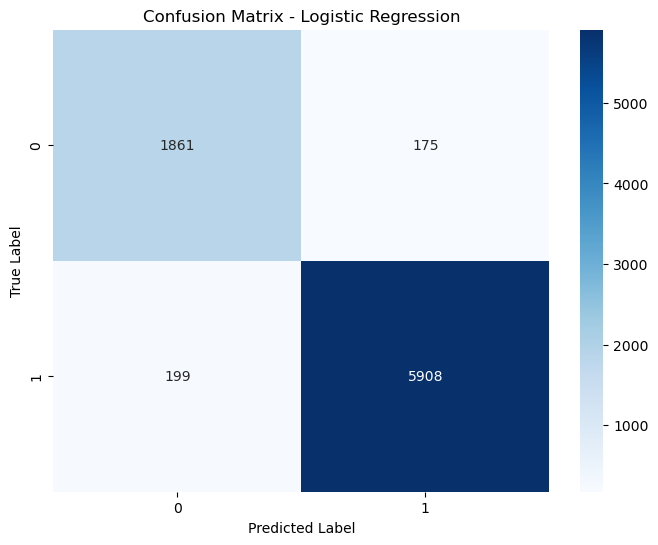

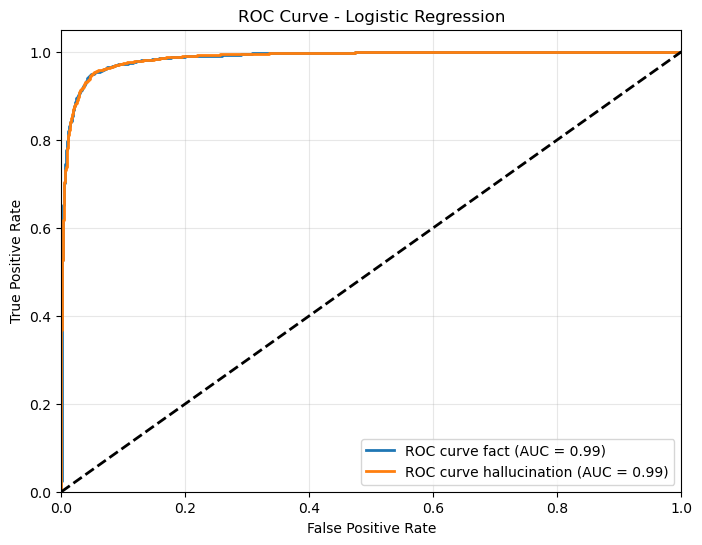

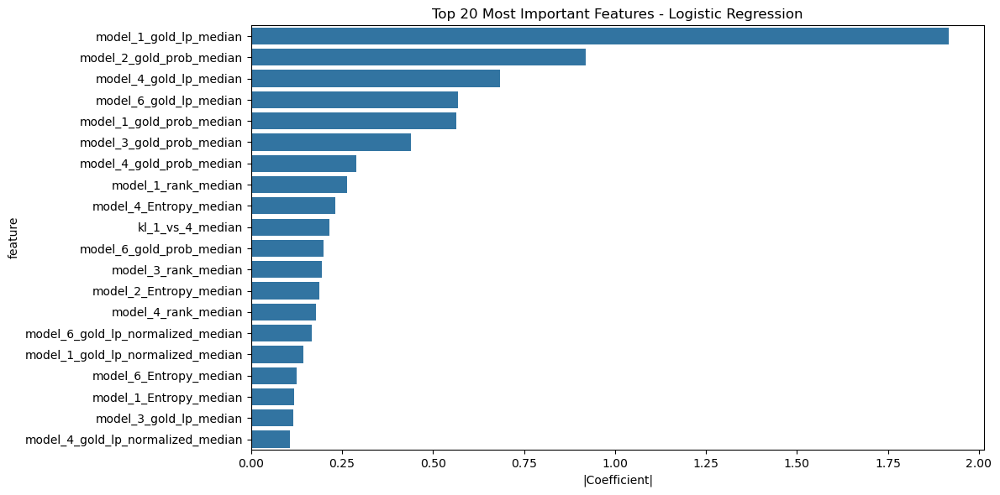


Top 10 Most Important Features and their coefficients:
                     feature  coefficient
17    model_1_gold_lp_median    -1.918053
32  model_2_gold_prob_median    -0.920074
19    model_4_gold_lp_median    -0.684836
23    model_6_gold_lp_median    -0.569058
6   model_1_gold_prob_median    -0.563621
8   model_3_gold_prob_median    -0.439911
21  model_4_gold_prob_median     0.288763
13       model_1_rank_median     0.264360
12    model_4_Entropy_median     0.231045
31          kl_1_vs_4_median    -0.216396

AUC Scores for each class:
fact: 0.987
hallucination: 0.987

Model intercept: [3.46467496]
Number of iterations needed: [48]


In [17]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# 1. Prepare the data
X = df_clean.drop(['label', 'source_file', 'file_path', 'nct_number'], axis=1)
y = df_clean['label']

# Print original labels
print("Original unique labels:", y.unique())

# 2. Split the data
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# 3. Scale the features (important for logistic regression)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Print split sizes
print("\nTraining set size:", X_train.shape[0])
print("Test set size:", X_test.shape[0])
print("\nClass distribution:")
print("Training set:\n", y_train.value_counts(normalize=True))
print("\nTest set:\n", y_test.value_counts(normalize=True))

# 4. Create and train the model
log_reg = LogisticRegression(
    max_iter=1000,
    random_state=42,
    n_jobs=-1
)

log_reg.fit(X_train_scaled, y_train)

# 5. Make predictions
y_pred = log_reg.predict(X_test_scaled)
y_pred_proba = log_reg.predict_proba(X_test_scaled)

# 6. Print model coefficients
print("\nModel classes:", log_reg.classes_)

# 7. Evaluate the model
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# 8. Plot confusion matrix
plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix - Logistic Regression')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

# 9. Plot ROC curve
plt.figure(figsize=(8, 6))

# Get unique classes
classes = log_reg.classes_

# Calculate ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i, class_name in enumerate(classes):
    fpr[i], tpr[i], _ = roc_curve(y_test == class_name, y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    
    plt.plot(fpr[i], tpr[i], lw=2,
             label=f'ROC curve {class_name} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Logistic Regression')
plt.legend(loc="lower right")
plt.grid(True, alpha=0.3)
plt.show()

# 10. Feature importance (using absolute values of coefficients)
feature_importance = pd.DataFrame({
    'feature': X.columns,
    'coefficient': np.abs(log_reg.coef_[0])  # Use absolute values
})
feature_importance = feature_importance.sort_values('coefficient', ascending=False)

plt.figure(figsize=(12, 6))
sns.barplot(data=feature_importance.head(20), x='coefficient', y='feature')
plt.title('Top 20 Most Important Features - Logistic Regression')
plt.xlabel('|Coefficient|')
plt.tight_layout()
plt.show()

# 11. Print top 10 features and their coefficients
print("\nTop 10 Most Important Features and their coefficients:")
top_features = pd.DataFrame({
    'feature': X.columns,
    'coefficient': log_reg.coef_[0]  # Original coefficients with signs
})
top_features['abs_coef'] = np.abs(top_features['coefficient'])
top_features = top_features.sort_values('abs_coef', ascending=False)
print(top_features[['feature', 'coefficient']].head(10))

print("\nAUC Scores for each class:")
for i, class_name in enumerate(classes):
    print(f"{class_name}: {roc_auc[i]:.3f}")

# 12. Model parameters
print("\nModel intercept:", log_reg.intercept_)
print("Number of iterations needed:", log_reg.n_iter_)

## PCA + Features Random forest

Shape of combined features: (40712, 70)
Number of original features: 36
Number of PCA features: 35

Training set size: 32569
Test set size: 8143

Class distribution:
Training set:
 label
hallucination    0.750008
fact             0.249992
Name: proportion, dtype: float64

Test set:
 label
hallucination    0.749969
fact             0.250031
Name: proportion, dtype: float64


<>:123: SyntaxWarning:

invalid escape sequence '\d'

<>:123: SyntaxWarning:

invalid escape sequence '\d'

/tmp/ipykernel_2705459/1982814663.py:123: SyntaxWarning:

invalid escape sequence '\d'




Tree Depth Statistics:
Average depth: 27.3
Maximum depth: 39
Minimum depth: 21

Classification Report:
               precision    recall  f1-score   support

         fact       0.91      0.91      0.91      2036
hallucination       0.97      0.97      0.97      6107

     accuracy                           0.95      8143
    macro avg       0.94      0.94      0.94      8143
 weighted avg       0.95      0.95      0.95      8143



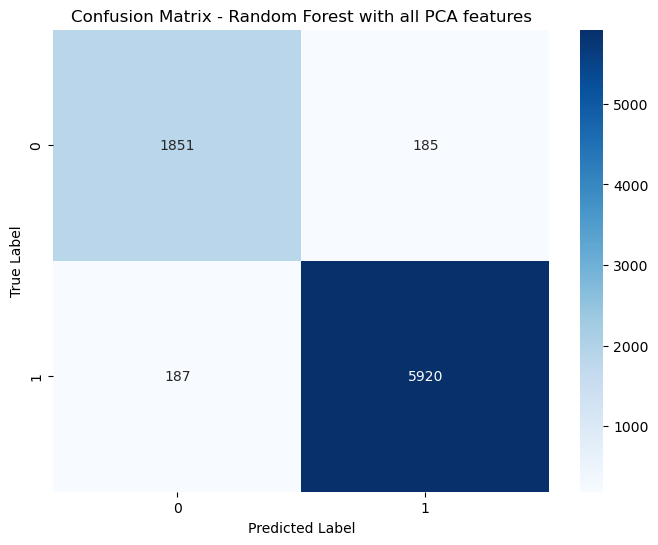

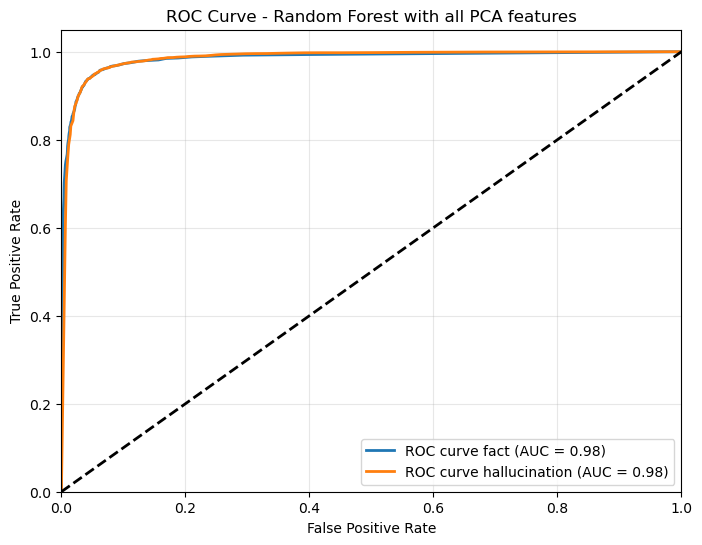

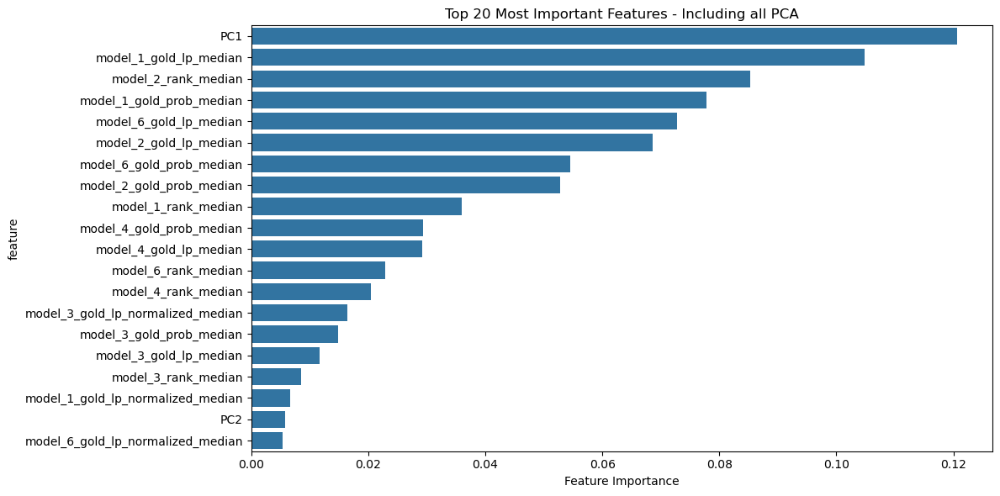


Top 10 Most Important Features:
                     feature  importance
35                       PC1    0.120643
17    model_1_gold_lp_median    0.104844
9        model_2_rank_median    0.085320
6   model_1_gold_prob_median    0.077828
23    model_6_gold_lp_median    0.072808
11    model_2_gold_lp_median    0.068617
33  model_6_gold_prob_median    0.054493
32  model_2_gold_prob_median    0.052799
13       model_1_rank_median    0.035918
21  model_4_gold_prob_median    0.029298

AUC Scores for each class:
fact: 0.985
hallucination: 0.985

Top 10 PCA Features Importance Ranking:
PC1: Importance = 0.1206, Rank = 1
PC2: Importance = 0.0058, Rank = 19
PC28: Importance = 0.0049, Rank = 21
PC5: Importance = 0.0039, Rank = 26
PC8: Importance = 0.0036, Rank = 27
PC10: Importance = 0.0034, Rank = 28
PC26: Importance = 0.0033, Rank = 30
PC33: Importance = 0.0033, Rank = 31
PC4: Importance = 0.0032, Rank = 33
PC27: Importance = 0.0032, Rank = 36


/tmp/ipykernel_2705459/1982814663.py:123: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



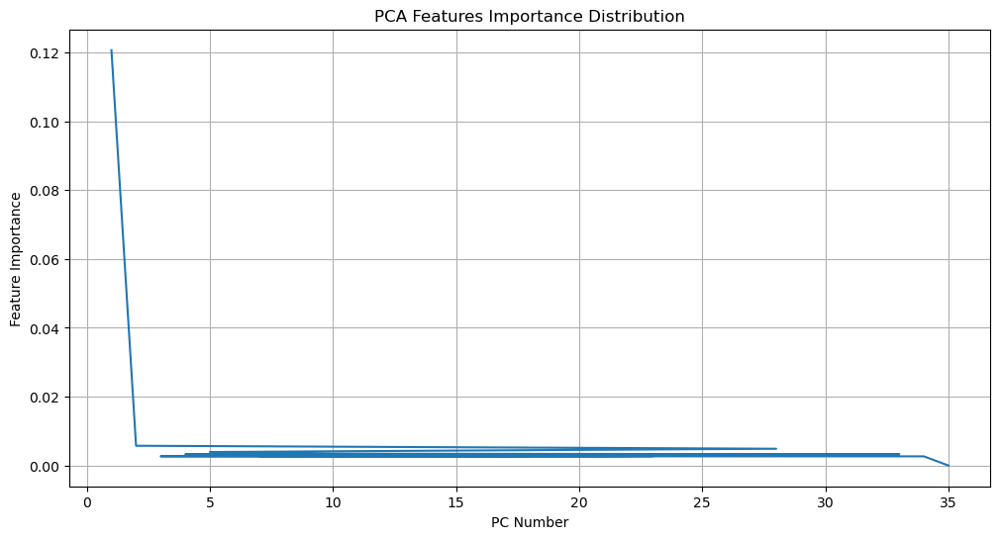

In [18]:
# 1. Prepare the combined dataset
# Get all PCs
pca_features = pca_df[[col for col in pca_df.columns if col.startswith('PC')]].copy()

# Combine original features with PCA
X_combined = pd.concat([
    df_clean.drop(['label', 'source_file', 'file_path', 'nct_number'], axis=1),  # Original features
    pca_features  # All PCA features
], axis=1)

y = df_clean['label']

print("Shape of combined features:", X_combined.shape)
print("Number of original features:", len(df_clean.drop(['label', 'source_file', 'file_path'], axis=1).columns))
print("Number of PCA features:", len(pca_features.columns))

# 2. Split the data
X_train, X_test, y_train, y_test = train_test_split(
    X_combined, y, test_size=0.2, random_state=42, stratify=y
)

# Print split sizes
print("\nTraining set size:", X_train.shape[0])
print("Test set size:", X_test.shape[0])
print("\nClass distribution:")
print("Training set:\n", y_train.value_counts(normalize=True))
print("\nTest set:\n", y_test.value_counts(normalize=True))

# 3. Create and train the model
rf_classifier = RandomForestClassifier(
    n_estimators=100,
    max_depth=None,
    min_samples_split=2,
    min_samples_leaf=1,
    random_state=42,
    n_jobs=-1
)

rf_classifier.fit(X_train, y_train)

# Get maximum depth of trees
max_depths = [estimator.get_depth() for estimator in rf_classifier.estimators_]
print("\nTree Depth Statistics:")
print(f"Average depth: {np.mean(max_depths):.1f}")
print(f"Maximum depth: {np.max(max_depths)}")
print(f"Minimum depth: {np.min(max_depths)}")

# 4. Make predictions
y_pred = rf_classifier.predict(X_test)
y_pred_proba = rf_classifier.predict_proba(X_test)

# 5. Evaluate the model
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# 6. Plot confusion matrix
plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix - Random Forest with all PCA features')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

# 7. Plot ROC curve
plt.figure(figsize=(8, 6))

# Get unique classes
classes = rf_classifier.classes_

# Calculate ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i, class_name in enumerate(classes):
    fpr[i], tpr[i], _ = roc_curve(y_test == class_name, y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    
    plt.plot(fpr[i], tpr[i], lw=2,
             label=f'ROC curve {class_name} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Random Forest with all PCA features')
plt.legend(loc="lower right")
plt.grid(True, alpha=0.3)
plt.show()

# 8. Feature importance (top 20)
feature_importance = pd.DataFrame({
    'feature': X_combined.columns,
    'importance': rf_classifier.feature_importances_
})
feature_importance = feature_importance.sort_values('importance', ascending=False)

plt.figure(figsize=(12, 6))
sns.barplot(data=feature_importance.head(20), x='importance', y='feature')
plt.title('Top 20 Most Important Features - Including all PCA')
plt.xlabel('Feature Importance')
plt.tight_layout()
plt.show()

# 9. Print top 10 features and AUC scores
print("\nTop 10 Most Important Features:")
print(feature_importance.head(10))

print("\nAUC Scores for each class:")
for i, class_name in enumerate(classes):
    print(f"{class_name}: {roc_auc[i]:.3f}")

# 10. Analyze importance of PCA features
pca_importance = feature_importance[feature_importance['feature'].str.startswith('PC')]
print("\nTop 10 PCA Features Importance Ranking:")
for idx, row in pca_importance.head(10).iterrows():
    print(f"{row['feature']}: Importance = {row['importance']:.4f}, Rank = {feature_importance.index.get_loc(idx) + 1}")

# 11. Plot PCA features importance distribution
plt.figure(figsize=(12, 6))
pca_importance['PC_number'] = pca_importance['feature'].str.extract('(\d+)').astype(int)
plt.plot(pca_importance['PC_number'], pca_importance['importance'])
plt.title('PCA Features Importance Distribution')
plt.xlabel('PC Number')
plt.ylabel('Feature Importance')
plt.grid(True)
plt.show()

## XGBoost

Label encoding mapping:
fact -> 0
hallucination -> 1

Training set size: 32569
Test set size: 8143

Class distribution:
Training set:
 1    0.750008
0    0.249992
Name: proportion, dtype: float64

Test set:
 1    0.749969
0    0.250031
Name: proportion, dtype: float64

Classification Report:
               precision    recall  f1-score   support

         fact       0.91      0.91      0.91      2036
hallucination       0.97      0.97      0.97      6107

     accuracy                           0.96      8143
    macro avg       0.94      0.94      0.94      8143
 weighted avg       0.96      0.96      0.96      8143



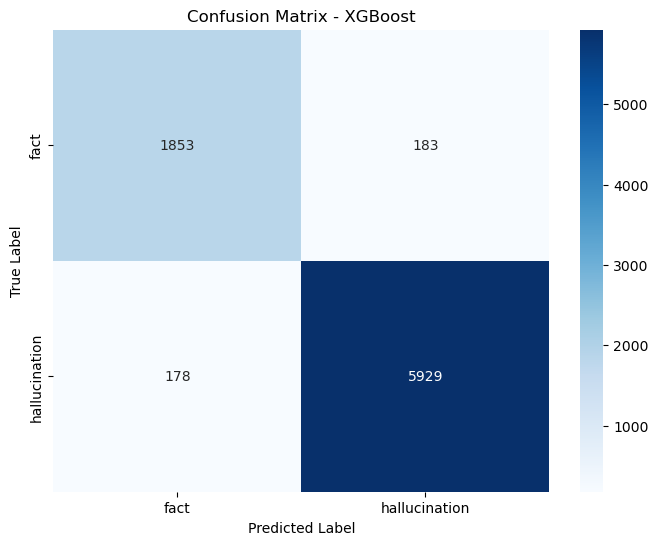

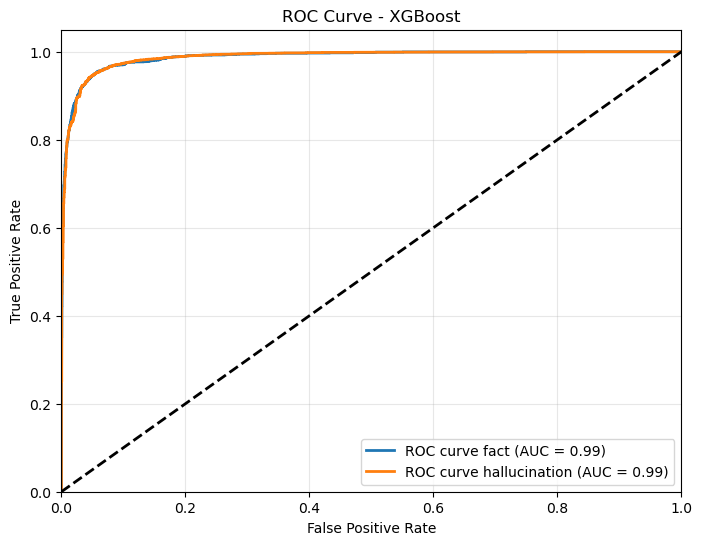

<Figure size 1200x600 with 0 Axes>

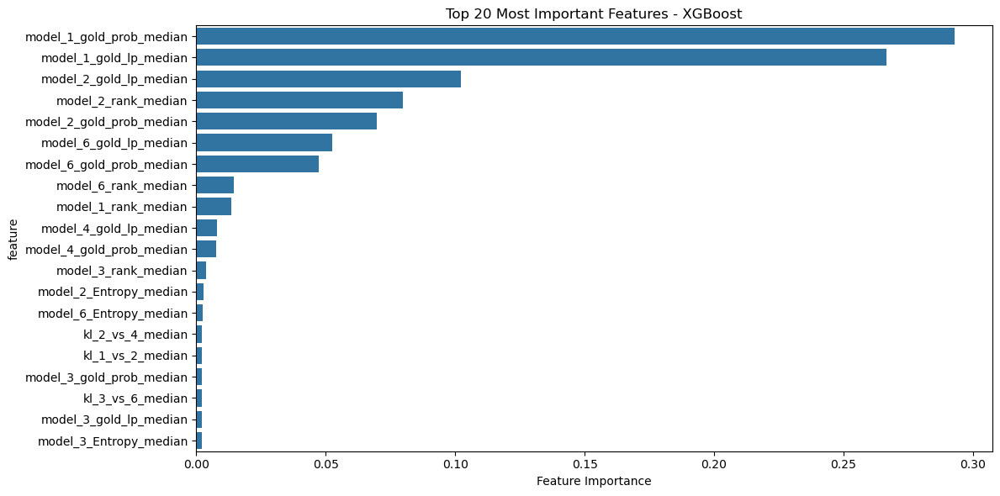


Top 10 Most Important Features:
                     feature  importance
6   model_1_gold_prob_median    0.292868
17    model_1_gold_lp_median    0.266654
11    model_2_gold_lp_median    0.102332
9        model_2_rank_median    0.079873
32  model_2_gold_prob_median    0.069848
23    model_6_gold_lp_median    0.052484
33  model_6_gold_prob_median    0.047218
18       model_6_rank_median    0.014411
13       model_1_rank_median    0.013554
19    model_4_gold_lp_median    0.007984

AUC Scores for each class:
fact: 0.987
hallucination: 0.987


In [19]:
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import LabelEncoder
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# 1. Prepare the data
X = df_clean.drop(['label', 'source_file', 'file_path', 'nct_number'], axis=1)
y = df_clean['label']

# Encode labels
le = LabelEncoder()
y_encoded = le.fit_transform(y)

# Print encoding mapping
print("Label encoding mapping:")
for i, label in enumerate(le.classes_):
    print(f"{label} -> {i}")

# 2. Split the data
X_train, X_test, y_train, y_test = train_test_split(
    X, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded
)

# Print split sizes
print("\nTraining set size:", X_train.shape[0])
print("Test set size:", X_test.shape[0])
print("\nClass distribution:")
print("Training set:\n", pd.Series(y_train).value_counts(normalize=True))
print("\nTest set:\n", pd.Series(y_test).value_counts(normalize=True))

# 3. Create and train the model
xgb_classifier = xgb.XGBClassifier(
    n_estimators=5000,
    learning_rate=0.005,
    max_depth=3,
    min_child_weight=1,
    subsample=1.0,
    colsample_bytree=0.8,
    random_state=42,
    n_jobs=-1
)

# Fit the model
xgb_classifier.fit(X_train, y_train)

# 4. Make predictions
y_pred = xgb_classifier.predict(X_test)
y_pred_proba = xgb_classifier.predict_proba(X_test)

# Convert predictions back to original labels for display
y_test_original = le.inverse_transform(y_test)
y_pred_original = le.inverse_transform(y_pred)

# 5. Evaluate the model
print("\nClassification Report:")
print(classification_report(y_test_original, y_pred_original))

# 6. Plot confusion matrix
plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_test_original, y_pred_original)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=le.classes_,
            yticklabels=le.classes_)
plt.title('Confusion Matrix - XGBoost')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

# 7. Plot ROC curve
plt.figure(figsize=(8, 6))

# Calculate ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i, class_name in enumerate(le.classes_):
    fpr[i], tpr[i], _ = roc_curve(y_test == i, y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    
    plt.plot(fpr[i], tpr[i], lw=2,
             label=f'ROC curve {class_name} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - XGBoost')
plt.legend(loc="lower right")
plt.grid(True, alpha=0.3)
plt.show()

# 8. Feature importance
plt.figure(figsize=(12, 6))
feature_importance = pd.DataFrame({
    'feature': X.columns,
    'importance': xgb_classifier.feature_importances_
})
feature_importance = feature_importance.sort_values('importance', ascending=False)

plt.figure(figsize=(12, 6))
sns.barplot(data=feature_importance.head(20), x='importance', y='feature')
plt.title('Top 20 Most Important Features - XGBoost')
plt.xlabel('Feature Importance')
plt.tight_layout()
plt.show()

# 9. Print top 10 features and AUC scores
print("\nTop 10 Most Important Features:")
print(feature_importance.head(10))

print("\nAUC Scores for each class:")
for i, class_name in enumerate(le.classes_):
    print(f"{class_name}: {roc_auc[i]:.3f}")

## USE XGBOOST to predict in testset

Loading test data...
Making predictions...

Classification Report on Test Set:
               precision    recall  f1-score   support

         fact       0.80      0.78      0.79      1273
hallucination       0.93      0.93      0.93      3819

     accuracy                           0.90      5092
    macro avg       0.86      0.86      0.86      5092
 weighted avg       0.90      0.90      0.90      5092



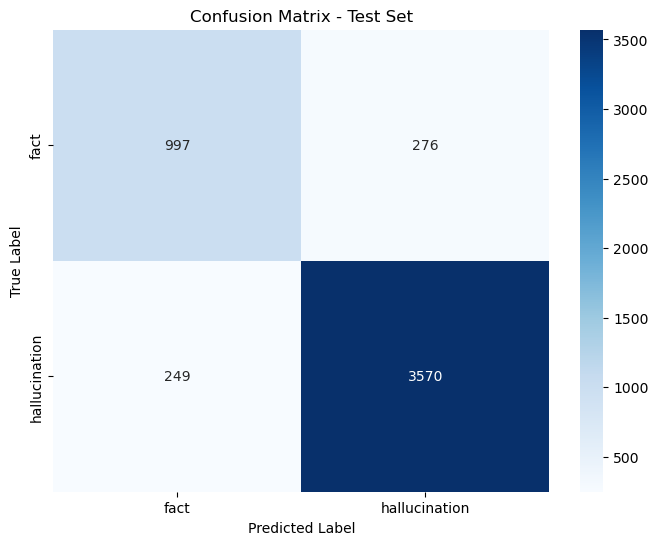

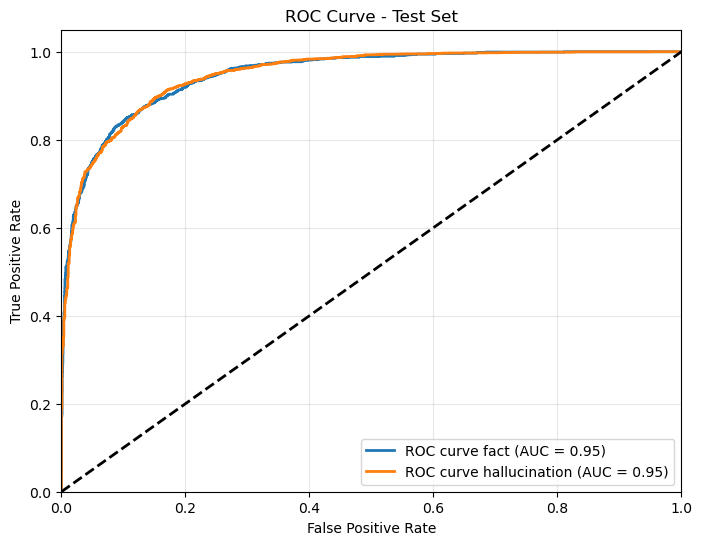


AUC Scores for each class:
fact: 0.949
hallucination: 0.949

Predictions saved to: test_MEDQA_first_token_predictions.csv


<Figure size 1200x600 with 0 Axes>

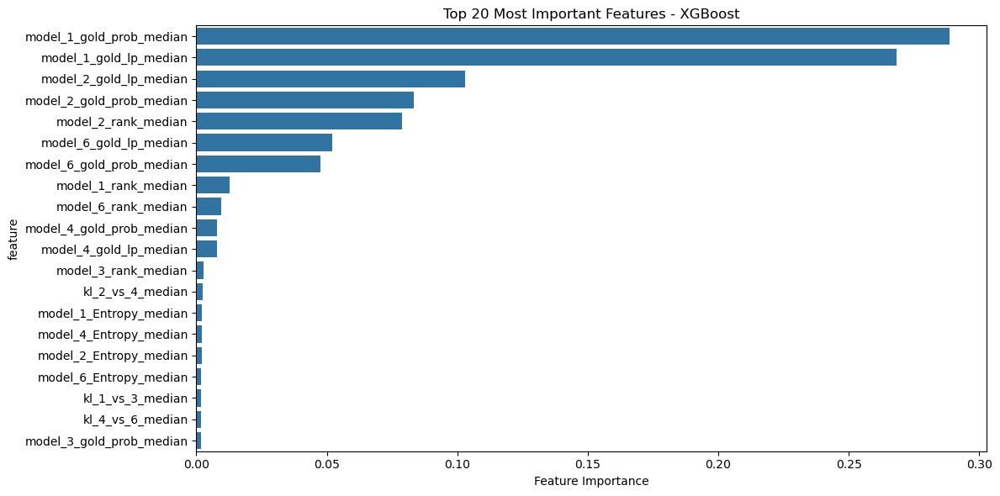


Top 10 Most Important Features:
                     feature  importance
6   model_1_gold_prob_median    0.288482
17    model_1_gold_lp_median    0.268278
11    model_2_gold_lp_median    0.102948
32  model_2_gold_prob_median    0.083216
9        model_2_rank_median    0.078664
23    model_6_gold_lp_median    0.052200
33  model_6_gold_prob_median    0.047593
13       model_1_rank_median    0.012715
18       model_6_rank_median    0.009511
21  model_4_gold_prob_median    0.008079

Sample predictions:
           label predicted_label  probability_fact  probability_hallucination
0  hallucination            fact          0.993570                   0.006430
1           fact   hallucination          0.005110                   0.994890
2  hallucination   hallucination          0.002001                   0.997999
3  hallucination   hallucination          0.000120                   0.999880
4  hallucination   hallucination          0.009037                   0.990963


In [20]:
import pandas as pd
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import LabelEncoder
import seaborn as sns
import matplotlib.pyplot as plt
import xgboost as xgb

def predict_new_data(xgb_classifier, le, test_file_path, feature_columns):
    """
    Predict labels for new data using trained XGBoost classifier
    
    Args:
        xgb_classifier: Trained XGBoost classifier
        le: Fitted LabelEncoder
        test_file_path: Path to test CSV file
        feature_columns: List of feature columns used in training
    """
    try:
        # Load test data
        print("Loading test data...")
        df_test = pd.read_csv(test_file_path)
        df_test = df_test.dropna()
        
        # Ensure test data has same features as training data
        X_new = df_test[feature_columns]
        
        # Make predictions
        print("Making predictions...")
        y_pred = xgb_classifier.predict(X_new)
        y_pred_proba = xgb_classifier.predict_proba(X_new)
        
        # Convert numeric predictions to labels
        y_pred_labels = le.inverse_transform(y_pred)
        
        # If test data has true labels, evaluate performance
        if 'label' in df_test.columns:
            y_true = df_test['label']
            
            # Print classification report
            print("\nClassification Report on Test Set:")
            print(classification_report(y_true, y_pred_labels))
            
            # Plot confusion matrix
            plt.figure(figsize=(8, 6))
            cm = confusion_matrix(y_true, y_pred_labels)
            sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                       xticklabels=le.classes_,
                       yticklabels=le.classes_)
            plt.title('Confusion Matrix - Test Set')
            plt.ylabel('True Label')
            plt.xlabel('Predicted Label')
            plt.show()
            
            # Plot ROC curve
            plt.figure(figsize=(8, 6))
            
            # Calculate ROC curve and ROC area for each class
            fpr = dict()
            tpr = dict()
            roc_auc = dict()
            
            for i, class_name in enumerate(le.classes_):
                fpr[i], tpr[i], _ = roc_curve(le.transform(y_true) == i, y_pred_proba[:, i])
                roc_auc[i] = auc(fpr[i], tpr[i])
                
                plt.plot(fpr[i], tpr[i], lw=2,
                        label=f'ROC curve {class_name} (AUC = {roc_auc[i]:.2f})')
            
            plt.plot([0, 1], [0, 1], 'k--', lw=2)
            plt.xlim([0.0, 1.0])
            plt.ylim([0.0, 1.05])
            plt.xlabel('False Positive Rate')
            plt.ylabel('True Positive Rate')
            plt.title('ROC Curve - Test Set')
            plt.legend(loc="lower right")
            plt.grid(True, alpha=0.3)
            plt.show()
            
            # Print AUC scores
            print("\nAUC Scores for each class:")
            for i, class_name in enumerate(le.classes_):
                print(f"{class_name}: {roc_auc[i]:.3f}")
        
        # Add predictions to dataframe
        df_test['predicted_label'] = y_pred_labels
        
        # Add probability scores
        for i, class_name in enumerate(le.classes_):
            df_test[f'probability_{class_name}'] = y_pred_proba[:, i]
        
        # Save results
        output_path = test_file_path.replace('.csv', '_predictions.csv')
        df_test.to_csv(output_path, index=False)
        print(f"\nPredictions saved to: {output_path}")
        
        # Plot feature importance
        plt.figure(figsize=(12, 6))
        feature_importance = pd.DataFrame({
            'feature': feature_columns,
            'importance': xgb_classifier.feature_importances_
        })
        feature_importance = feature_importance.sort_values('importance', ascending=False)

        plt.figure(figsize=(12, 6))
        sns.barplot(data=feature_importance.head(20), x='importance', y='feature')
        plt.title('Top 20 Most Important Features - XGBoost')
        plt.xlabel('Feature Importance')
        plt.tight_layout()
        plt.show()

        # Print top 10 features
        print("\nTop 10 Most Important Features:")
        print(feature_importance.head(10))
        
        return df_test
        
    except Exception as e:
        print(f"Error in prediction: {str(e)}")
        return None

# Example usage
def main():
    # Path to test file
    test_file_path = 'test_MEDQA_first_token.csv'
    
    # Create and train XGBoost model (assuming you have X and y from training data)
    X = df_clean.drop(['label', 'source_file', 'file_path', 'nct_number'], axis=1)
    y = df_clean['label']

    # Encode labels
    le = LabelEncoder()
    y_encoded = le.fit_transform(y)

    # Create and train the model
    xgb_classifier = xgb.XGBClassifier(
        n_estimators=5000,
        learning_rate=0.005,
        max_depth=3,
        min_child_weight=1,
        subsample=1.0,
        colsample_bytree=0.8,
        random_state=42,
        n_jobs=-1
    )

    # Fit the model
    xgb_classifier.fit(X, y_encoded)
    
    # Get feature columns
    feature_columns = X.columns.tolist()
    
    # Make predictions
    results = predict_new_data(xgb_classifier, le, test_file_path, feature_columns)
    
    if results is not None:
        # Print some example predictions
        print("\nSample predictions:")
        print(results[['label', 'predicted_label'] + 
              [col for col in results.columns if 'probability_' in col]].head())

if __name__ == "__main__":
    main()

## Evaluate Predictions

In [74]:
import pandas as pd
df_result = pd.read_csv('test_MEDQA_first_token_predictions.csv')
df_result = df_result[['label', 'source_file', 'file_path', 'predicted_label', 'probability_fact', 'probability_hallucination']]
df_result['nct_number'] = df_result['file_path'].str.extract(r'(NCT\d+)')
df_result['predicted_label_threshold'] = df_result['probability_fact'].apply(lambda x: 'fact' if x > 0.05 else 'hallucination')
df_result.head(30)

,label,source_file,file_path,predicted_label,probability_fact,probability_hallucination,nct_number,predicted_label_threshold
0,hallucination,logprob_matrix_1.csv,NCT00001/logprob_matrix_1.csv,fact,0.993570,0.006430,NCT00001,fact
1,fact,logprob_matrix_2.csv,NCT00001/logprob_matrix_2.csv,hallucination,0.005110,0.994890,NCT00001,hallucination
2,hallucination,logprob_matrix_3.csv,NCT00001/logprob_matrix_3.csv,hallucination,0.002001,0.997999,NCT00001,hallucination
3,hallucination,logprob_matrix_4.csv,NCT00001/logprob_matrix_4.csv,hallucination,0.000120,0.999880,NCT00001,hallucination
4,hallucination,logprob_matrix_1.csv,NCT00002/logprob_matrix_1.csv,hallucination,0.009037,0.990963,NCT00002,hallucination
5,hallucination,logprob_matrix_2.csv,NCT00002/logprob_matrix_2.csv,hallucination,0.042654,0.957346,NCT00002,hallucination
6,hallucination,logprob_matrix_3.csv,NCT00002/logprob_matrix_3.csv,hallucination,0.168602,0.831398,NCT00002,fact
7,fact,logprob_matrix_4.csv,NCT00002/logprob_matrix_4.csv,fact,0.748037,0.251963,NCT00002,fact
8,hallucination,logprob_matrix_1.csv,NCT00003/logprob_matrix_1.csv,hallucination,0.001275,0.998725,NCT00003,hallucination
9,fact,logprob_matrix_2.csv,NCT00003/logprob_matrix_2.csv,fact,0.999154,0.000846,NCT00003,fact


## Top-2 Accuracy

In [75]:
# Function to check if fact is in top 2 rows and count actual facts
def analyze_study(group):
    # Get indices of top 2 probability_fact values
    top2_indices = group['probability_fact'].nlargest(2).index
    
    # Count actual facts in top 2 predictions
    facts_in_top2 = group.loc[top2_indices, 'label'].value_counts().get('fact', 0)
    
    # Count total actual facts in study
    total_facts = (group['label'] == 'fact').sum()
    
    return pd.Series({
        'facts_in_top2': facts_in_top2,
        'total_facts': total_facts
    })

# Apply analysis to each study
results = df_result.groupby('nct_number').apply(analyze_study)

# Calculate statistics
total_studies = len(results)
studies_with_fact_in_top2 = (results['facts_in_top2'] > 0).sum()
accuracy = studies_with_fact_in_top2 / total_studies

# Print results
print(f"Total studies analyzed: {total_studies}")
print(f"Studies with fact in top-2 predictions: {studies_with_fact_in_top2}")
print(f"Top-2 accuracy: {accuracy:.4f}")

# Distribution of facts found in top-2
print("\nDistribution of facts found in top-2:")
print(results['facts_in_top2'].value_counts().sort_index())

# Verify total facts per study
print("\nDistribution of total facts per study:")
print(results['total_facts'].value_counts().sort_index())

# Optional: Show some example studies
print("\nExample studies (first 5):")
print(results.head(20))

Total studies analyzed: 1273
Studies with fact in top-2 predictions: 1173
Top-2 accuracy: 0.9214

Distribution of facts found in top-2:
facts_in_top2
0     100
1    1173
Name: count, dtype: int64

Distribution of total facts per study:
total_facts
1    1273
Name: count, dtype: int64

Example studies (first 5):
            facts_in_top2  total_facts
nct_number                            
NCT00001                1            1
NCT00002                1            1
NCT00003                1            1
NCT00004                0            1
NCT00005                1            1
NCT00006                0            1
NCT00007                1            1
NCT00008                1            1
NCT00009                1            1
NCT00010                1            1
NCT00011                1            1
NCT00012                1            1
NCT00013                1            1
NCT00014                1            1
NCT00015                1            1
NCT00016                1

/tmp/ipykernel_2705459/39280462.py:18: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



## Top-3 Accuracy

In [77]:
# Function to check if fact is in top 2 rows and count actual facts
def analyze_study(group):
    # Get indices of top 3 probability_fact values
    top3_indices = group['probability_fact'].nlargest(3).index
    
    # Count actual facts in top 3 predictions
    facts_in_top3 = group.loc[top3_indices, 'label'].value_counts().get('fact', 0)
    
    # Count total actual facts in study
    total_facts = (group['label'] == 'fact').sum()
    
    return pd.Series({
        'facts_in_top3': facts_in_top3,
        'total_facts': total_facts
    })

# Apply analysis to each study
results = df_result.groupby('nct_number').apply(analyze_study)

# Calculate statistics
total_studies = len(results)
studies_with_fact_in_top3 = (results['facts_in_top3'] > 0).sum()
accuracy = studies_with_fact_in_top3 / total_studies

# Print results
print(f"Total studies analyzed: {total_studies}")
print(f"Studies with fact in top-2 predictions: {studies_with_fact_in_top3}")
print(f"Top-3 accuracy: {accuracy:.4f}")

# Distribution of facts found in top-3
print("\nDistribution of facts found in top-3:")
print(results['facts_in_top3'].value_counts().sort_index())

# Verify total facts per study
print("\nDistribution of total facts per study:")
print(results['total_facts'].value_counts().sort_index())

# Optional: Show some example studies
print("\nExample studies (first 5):")
print(results.head(20))

Total studies analyzed: 1273
Studies with fact in top-2 predictions: 1235
Top-3 accuracy: 0.9701

Distribution of facts found in top-3:
facts_in_top3
0      38
1    1235
Name: count, dtype: int64

Distribution of total facts per study:
total_facts
1    1273
Name: count, dtype: int64

Example studies (first 5):
            facts_in_top3  total_facts
nct_number                            
NCT00001                1            1
NCT00002                1            1
NCT00003                1            1
NCT00004                1            1
NCT00005                1            1
NCT00006                1            1
NCT00007                1            1
NCT00008                1            1
NCT00009                1            1
NCT00010                1            1
NCT00011                1            1
NCT00012                1            1
NCT00013                1            1
NCT00014                1            1
NCT00015                1            1
NCT00016                1

/tmp/ipykernel_2705459/3049354710.py:18: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



In [59]:
df_result['predicted_label'].value_counts()/len(df_result)

predicted_label
hallucination    0.755302
fact             0.244698
Name: count, dtype: float64

In [60]:
df_result['predicted_label_threshold'].value_counts()/len(df_result)

predicted_label_threshold
hallucination    0.615672
fact             0.384328
Name: count, dtype: float64

## 1-Fact 3-hall dist

In [61]:
# Group by nct_number and count predicted labels
label_counts = df_result.groupby('nct_number')['predicted_label_threshold'].value_counts().unstack(fill_value=0)

# Find studies to keep (having exactly 3 hallucinations and 1 fact)
studies_to_keep = label_counts[
    ((label_counts['hallucination'] == 3) & (label_counts['fact'] == 1))
].index

# Filter the original dataframe
df_filtered = df_result[df_result['nct_number'].isin(studies_to_keep)]

# Print summary
print(f"Original number of studies: {df_result['nct_number'].nunique()}")
print(f"Studies kept: {len(studies_to_keep)}")
print(f"Studies removed: {df_result['nct_number'].nunique() - len(studies_to_keep)}")
print(f"\nOriginal number of rows: {len(df_result)}")
print(f"Rows after filtering: {len(df_filtered)}")

# Optional: verify the distribution in kept studies
print("\nVerifying distribution in kept studies:")
verification = df_filtered.groupby('nct_number')['predicted_label_threshold'].value_counts().unstack(fill_value=0)
print(verification.head())

Original number of studies: 1273
Studies kept: 817
Studies removed: 456

Original number of rows: 5092
Rows after filtering: 3268

Verifying distribution in kept studies:
predicted_label_threshold  fact  hallucination
nct_number                                    
NCT00001                      1              3
NCT00003                      1              3
NCT00005                      1              3
NCT00006                      1              3
NCT00008                      1              3


In [62]:
# Count when both columns are 'fact'
matching_facts = len(df_filtered[(df_filtered['label'] == 'fact') & (df_filtered['predicted_label_threshold'] == 'fact')])
pred_facts = (df_filtered['predicted_label_threshold'] == 'fact').sum()

matching_halluc = len(df_filtered[(df_filtered['label'] == 'hallucination') & (df_filtered['predicted_label_threshold'] == 'hallucination')])
pred_halluc = (df_filtered['predicted_label_threshold'] == 'hallucination').sum()
total_matches = matching_facts + matching_halluc
total_samples = len(df_filtered)

print("Acc-facts:", matching_facts / pred_facts)
print("Acc-Hall:", matching_halluc / pred_halluc)
print("Accuracy:", total_matches/total_samples*100)

Acc-facts: 0.9277845777233782
Acc-Hall: 0.9759281925744594
Accuracy: 96.38922888616891


In [63]:
# Extract NCT number and group by it
# df_result['nct_number'] = df_result['file_path'].str.extract(r'(NCT\d+)')
selected_df = df_filtered.loc[df_filtered.groupby('nct_number')['probability_fact'].idxmax()]
# selected_df['predicted_fact_label'] = 'fact'
selected_df = selected_df.reset_index(drop=True)

# Count when both columns are 'fact'
matching_facts = ((selected_df['label'] == 'fact') & (selected_df['predicted_label_threshold'] == 'fact')).sum()
total_samples = len(selected_df)

print(f"Accuracy of predicting the right answer: {matching_facts} out of {total_samples} ({matching_facts/total_samples*100:.2f}%)")

Accuracy of predicting the right answer: 758 out of 817 (92.78%)


## Check predictions by study

In [40]:
def check_fact_predictions(df):
    """
    Check if each study has at least one 'fact' prediction and add no_fact_prediction column
    """
    # Create a copy of the DataFrame to avoid modifying the original
    df = df.copy()
    
    # Group by nct_number and get stats
    fact_check = df.groupby('nct_number').agg({
        'predicted_label': ['count', lambda x: 'fact' in x.values]
    })
    
    # Rename columns
    fact_check.columns = ['total_predictions', 'has_fact_prediction']
    
    # Add count of fact predictions
    fact_counts = df[df['predicted_label'] == 'fact'].groupby('nct_number').size()
    fact_check['fact_predictions'] = fact_counts.reindex(fact_check.index).fillna(0).astype(int)
    
    # Calculate percentage of fact predictions
    fact_check['fact_percentage'] = (fact_check['fact_predictions'] / fact_check['total_predictions'] * 100).round(2)
    
    # Get studies with no facts
    studies_no_facts = fact_check[~fact_check['has_fact_prediction']].index.tolist()
    
    # Add no_fact_prediction column
    df['no_fact_prediction'] = df['nct_number'].isin(studies_no_facts)
    
    # Print summary
    print("\nSummary of fact predictions by study:")
    print(f"Total number of studies: {len(fact_check)}")
    print(f"Studies with at least one fact: {fact_check['has_fact_prediction'].sum()}")
    print(f"Studies with no facts: {(~fact_check['has_fact_prediction']).sum()}")
    
    # Print detailed information
    print("\nDetailed breakdown:")
    # print(fact_check.sort_values('fact_predictions', ascending=False))
    
    # Print studies with no facts
    print("\nStudies with no fact predictions:")
    print(f"Count: {len(studies_no_facts)}")
    if studies_no_facts:
        print("NCT numbers:", studies_no_facts)
        
        # Print example rows from studies with no facts
        # print("\nExample rows from studies with no facts:")
        # example_df = df[df['no_fact_prediction']].head()
        # print(example_df[['nct_number', 'predicted_label', 'probability_fact', 'no_fact_prediction']])
    
    # Optional: Save detailed results
    fact_check.to_csv('fact_prediction_analysis.csv')
    print("\nDetailed analysis saved to 'fact_prediction_analysis.csv'")
    
    return df, fact_check

def main():
    # Using your df_result DataFrame
    df_with_flag, fact_analysis = check_fact_predictions(df_result)
    
    # Save the updated DataFrame with the new column
    df_with_flag.to_csv('predictions_sin_fact.csv', index=False)
    print("\nUpdated DataFrame saved to 'predictions_with_no_fact_flag.csv'")
    
    # Print sample of the updated DataFrame
    print("\nSample of updated DataFrame:")
    # print(df_with_flag[['nct_number', 'predicted_label', 'probability_fact', 'no_fact_prediction']].head(10))

if __name__ == "__main__":
    main()


Summary of fact predictions by study:
Total number of studies: 1273
Studies with at least one fact: 1229
Studies with no facts: 44

Detailed breakdown:

Studies with no fact predictions:
Count: 44
NCT numbers: ['NCT00020', 'NCT00039', 'NCT00047', 'NCT00076', 'NCT00101', 'NCT00150', 'NCT00179', 'NCT00300', 'NCT00429', 'NCT00457', 'NCT00555', 'NCT00606', 'NCT00632', 'NCT00635', 'NCT00652', 'NCT00662', 'NCT00688', 'NCT00710', 'NCT00739', 'NCT00747', 'NCT00758', 'NCT00763', 'NCT00786', 'NCT00803', 'NCT00887', 'NCT00934', 'NCT00946', 'NCT00968', 'NCT01001', 'NCT01009', 'NCT01017', 'NCT01022', 'NCT01052', 'NCT01061', 'NCT01078', 'NCT01108', 'NCT01135', 'NCT01136', 'NCT01147', 'NCT01162', 'NCT01185', 'NCT01256', 'NCT01266', 'NCT01267']

Detailed analysis saved to 'fact_prediction_analysis.csv'

Updated DataFrame saved to 'predictions_with_no_fact_flag.csv'

Sample of updated DataFrame:


In [41]:
df_with_flag = pd.read_csv('predictions_sin_fact.csv')
print('Facts', (df_with_flag['predicted_label']=='fact').sum())
print('Facts_treshold', (df_with_flag['predicted_label_threshold']=='fact').sum())

df_with_flag

Facts 1245
Facts_treshold 1485


,label,source_file,file_path,predicted_label,probability_fact,probability_hallucination,nct_number,predicted_label_threshold,no_fact_prediction
0,hallucination,logprob_matrix_1.csv,NCT00001/logprob_matrix_1.csv,fact,0.993740,0.006260,NCT00001,fact,False
1,fact,logprob_matrix_2.csv,NCT00001/logprob_matrix_2.csv,hallucination,0.005144,0.994856,NCT00001,hallucination,False
2,hallucination,logprob_matrix_3.csv,NCT00001/logprob_matrix_3.csv,hallucination,0.002128,0.997872,NCT00001,hallucination,False
3,hallucination,logprob_matrix_4.csv,NCT00001/logprob_matrix_4.csv,hallucination,0.000120,0.999880,NCT00001,hallucination,False
4,hallucination,logprob_matrix_1.csv,NCT00002/logprob_matrix_1.csv,hallucination,0.009208,0.990792,NCT00002,hallucination,False
...,...,...,...,...,...,...,...,...,...
5087,hallucination,logprob_matrix_4.csv,NCT01272/logprob_matrix_4.csv,hallucination,0.000112,0.999888,NCT01272,hallucination,False
5088,hallucination,logprob_matrix_1.csv,NCT01273/logprob_matrix_1.csv,hallucination,0.000091,0.999909,NCT01273,hallucination,False
5089,hallucination,logprob_matrix_2.csv,NCT01273/logprob_matrix_2.csv,hallucination,0.000012,0.999988,NCT01273,hallucination,False
5090,fact,logprob_matrix_3.csv,NCT01273/logprob_matrix_3.csv,fact,0.999456,0.000544,NCT01273,fact,False


## Total Accuracy --> Matching predictions (Confusion Matrix)

In [42]:
# Count when both columns are 'fact'
matching_facts = len(df_result[(df_result['label'] == 'fact') & (df_result['predicted_label'] == 'fact')])
pred_facts = (df_result['predicted_label'] == 'fact').sum()

matching_halluc = len(df_result[(df_result['label'] == 'hallucination') & (df_result['predicted_label'] == 'hallucination')])
pred_halluc = (df_result['predicted_label'] == 'hallucination').sum()
total_matches = matching_facts + matching_halluc
total_samples = len(df_result)

print("Acc-facts:", matching_facts / pred_facts)
print("Acc-Hall:", matching_halluc / pred_halluc)
print("Accuracy:", total_matches/total_samples*100)

Acc-facts: 0.7991967871485943
Acc-Hall: 0.9277358981024175
Accuracy: 89.63079340141398


## With Treshold

In [43]:
# Count when both columns are 'fact'
matching_facts = len(df_result[(df_result['label'] == 'fact') & (df_result['predicted_label_threshold'] == 'fact')])
pred_facts = (df_result['predicted_label_threshold'] == 'fact').sum()

matching_halluc = len(df_result[(df_result['label'] == 'hallucination') & (df_result['predicted_label_threshold'] == 'hallucination')])
pred_halluc = (df_result['predicted_label_threshold'] == 'hallucination').sum()

total_matches = matching_facts + matching_halluc
total_samples = len(df_result)

print("ACC with Treshold")
print("Acc-facts:", matching_facts / pred_facts)
print("Acc-Hall:", matching_halluc / pred_halluc)
print("Accuracy:", total_matches/total_samples*100)

ACC with Treshold
Acc-facts: 0.7279461279461279
Acc-Hall: 0.9467701691156085
Accuracy: 88.29536527886881


## Matching FACTS

In [33]:
# Count when both columns are 'fact'
matching_facts = len(df_result[(df_result['label'] == 'fact') & (df_result['predicted_label_threshold'] == 'fact')])
total_samples = len(df_result)/4

print(f"Matching facts: {matching_facts} out of {total_samples} ({matching_facts/total_samples*100:.2f}%)")

Matching facts: 1081 out of 1273.0 (84.92%)


In [34]:
# Calculate accuracy by counting matching predictions
matches = (df_result['label'] == df_result['predicted_label_threshold']).sum()
total = len(df_result)
accuracy = matches / total

print(f"Matching predictions: {matches} out of {total}")
print(f"Accuracy: {accuracy:.4f} ({accuracy*100:.2f}%)")

Matching predictions: 4499 out of 5092
Accuracy: 0.8835 (88.35%)


In [35]:
# Calculate accuracy by counting matching predictions
no_matches = (df_result['label'] != df_result['predicted_label']).sum()
total = len(df_result)
accuracy = no_matches / total

print(f"No-Matching predictions: {no_matches} out of {total}")
print(f"Accuracy: {accuracy:.4f} ({accuracy*100:.2f}%)")

No-Matching predictions: 525 out of 5092
Accuracy: 0.1031 (10.31%)


## Accuracy by taking max fact_prop by NCTnumber

In [64]:
# Extract NCT number and group by it
# df_result['nct_number'] = df_result['file_path'].str.extract(r'(NCT\d+)')
selected_df = df_result.loc[df_result.groupby('nct_number')['probability_fact'].idxmax()]
selected_df['predicted_fact_label'] = 'fact'
selected_df = selected_df.reset_index(drop=True)
selected_df

,label,source_file,file_path,predicted_label,probability_fact,probability_hallucination,nct_number,predicted_label_threshold,predicted_fact_label
0,hallucination,logprob_matrix_1.csv,NCT00001/logprob_matrix_1.csv,fact,0.993570,0.006430,NCT00001,fact,fact
1,fact,logprob_matrix_4.csv,NCT00002/logprob_matrix_4.csv,fact,0.748037,0.251963,NCT00002,fact,fact
2,fact,logprob_matrix_2.csv,NCT00003/logprob_matrix_2.csv,fact,0.999154,0.000846,NCT00003,fact,fact
3,hallucination,logprob_matrix_2.csv,NCT00004/logprob_matrix_2.csv,fact,0.872007,0.127993,NCT00004,fact,fact
4,fact,logprob_matrix_2.csv,NCT00005/logprob_matrix_2.csv,fact,0.997190,0.002810,NCT00005,fact,fact
...,...,...,...,...,...,...,...,...,...
1268,fact,logprob_matrix_4.csv,NCT01269/logprob_matrix_4.csv,fact,0.980721,0.019279,NCT01269,fact,fact
1269,hallucination,logprob_matrix_3.csv,NCT01270/logprob_matrix_3.csv,fact,0.873835,0.126165,NCT01270,fact,fact
1270,fact,logprob_matrix_2.csv,NCT01271/logprob_matrix_2.csv,fact,0.628492,0.371508,NCT01271,fact,fact
1271,fact,logprob_matrix_3.csv,NCT01272/logprob_matrix_3.csv,fact,0.996161,0.003839,NCT01272,fact,fact


In [65]:
# Count when both columns are 'fact'
matching_facts = ((selected_df['label'] == 'fact') & (selected_df['predicted_fact_label'] == 'fact')).sum()
total_samples = len(selected_df)

print(f"Accuracy of predicting the right answer: {matching_facts} out of {total_samples} ({matching_facts/total_samples*100:.2f}%)")

Accuracy of predicting the right answer: 1006 out of 1273 (79.03%)


In [66]:
condition = ((selected_df['label'] == 'fact') & (selected_df['predicted_label'] == 'fact'))
no_matching_facts = selected_df[~condition]
no_matching_facts

,label,source_file,file_path,predicted_label,probability_fact,probability_hallucination,nct_number,predicted_label_threshold,predicted_fact_label
0,hallucination,logprob_matrix_1.csv,NCT00001/logprob_matrix_1.csv,fact,0.993570,0.006430,NCT00001,fact,fact
3,hallucination,logprob_matrix_2.csv,NCT00004/logprob_matrix_2.csv,fact,0.872007,0.127993,NCT00004,fact,fact
5,hallucination,logprob_matrix_2.csv,NCT00006/logprob_matrix_2.csv,fact,0.983761,0.016239,NCT00006,fact,fact
6,hallucination,logprob_matrix_2.csv,NCT00007/logprob_matrix_2.csv,fact,0.863088,0.136912,NCT00007,fact,fact
9,hallucination,logprob_matrix_2.csv,NCT00010/logprob_matrix_2.csv,fact,0.556456,0.443544,NCT00010,fact,fact
...,...,...,...,...,...,...,...,...,...
1255,fact,logprob_matrix_1.csv,NCT01256/logprob_matrix_1.csv,hallucination,0.366423,0.633577,NCT01256,fact,fact
1257,hallucination,logprob_matrix_1.csv,NCT01258/logprob_matrix_1.csv,fact,0.645591,0.354409,NCT01258,fact,fact
1265,fact,logprob_matrix_2.csv,NCT01266/logprob_matrix_2.csv,hallucination,0.379530,0.620470,NCT01266,fact,fact
1266,hallucination,logprob_matrix_2.csv,NCT01267/logprob_matrix_2.csv,hallucination,0.474969,0.525031,NCT01267,fact,fact
